#### imports

In [1]:
import tensorflow as tf
import keras
from keras.saving import load_model
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from keras.applications import MobileNetV2
from keras import layers,models
from tensorflow import data as tf_data
import os
import random
import zipfile
import shutil
import pandas as pd
from sklearn.metrics import (roc_curve, roc_auc_score, confusion_matrix,
                             ConfusionMatrixDisplay,classification_report)
import reload_data2
#from google.colab import drive
#drive.mount(' /content/drive')
import random
from PIL import Image
from tqdm import tqdm
from concurrent.futures import ProcessPoolExecutor

In [2]:
def process_image(args):
    img_path, output_path, target_size = args

    with Image.open(img_path) as img:
        img = img.convert("RGB")
        w, h = img.size

        if h > w:
            # Tall image → crop from bottom
            img = img.crop((0, 0, w, w))   # keep top square
            squared_img = img

        else:
            # Wide image → pad normally
            max_dim = max(w, h)

            squared_img = Image.new("RGB", (max_dim, max_dim), (255,255,255))
            squared_img.paste(img, (0,0))

        if target_size:
            squared_img = squared_img.resize(target_size, Image.LANCZOS)

        squared_img.save(output_path)

def process_dataset(input_root, output_root, target_size=None, workers=8):

    tasks = []

    for split in ["train", "val", "test"]:
        split_path = os.path.join(input_root, split)

        for class_name in os.listdir(split_path):

            class_path = os.path.join(split_path, class_name)
            if not os.path.isdir(class_path):
                continue

            output_class_path = os.path.join(output_root, split, class_name)
            os.makedirs(output_class_path, exist_ok=True)

            for img_name in os.listdir(class_path):
                if img_name.lower().endswith(('.png','.jpg','.jpeg')):

                    img_path = os.path.join(class_path, img_name)
                    output_path = os.path.join(output_class_path, img_name)

                    tasks.append((img_path, output_path, target_size))

    with ProcessPoolExecutor(max_workers=workers) as executor:
        list(tqdm(executor.map(process_image, tasks), total=len(tasks)))

    Handles "tall" & "wide" images differently

## Data Loading

In [3]:
df = pd.read_csv("/content/Handwriting_Metadata_clean.csv")
df=df.sort_values(by="wid").reset_index(drop=True)
df.head(5)

,wid,agegroup,gender,handedness
0,w0001,25-40,female,right
1,w0002,41-60,male,right
2,w0003,25-40,female,right
3,w0004,18-24,female,ambidextrous
4,w0005,18-24,male,right


In [4]:
drive_dir="/content/drive/MyDrive/CSAFE_zips"
data_dir = "/content/Data"

In [5]:
%%time
try:
    shutil.rmtree(data_dir)
    os.mkdir(data_dir)
except:
    pass

zips=list()
for path in os.listdir("/content/drive/MyDrive/CSAFE_zips"):
    if "CSAFE_All_Images_" in path:
        zips.append(path)

for z in zips:
    print(f"Unzipping: {z}")
    try:
        reload_data2.unzip(f"{drive_dir}/{z}",data_dir)
    except zipfile.BadZipFile:
        print(f"ERROR: {z}")
    print()

Unzipping: CSAFE_All_Images_3.zip

Unzipping: CSAFE_All_Images_4.zip

Unzipping: CSAFE_All_Images_1.zip

Unzipping: CSAFE_All_Images_2.zip

CPU times: user 16.9 s, sys: 4.83 s, total: 21.7 s
Wall time: 1min 6s


In [6]:
reload_data2.organize_unzipped_files(data_dir)

In [7]:
reload_data2.stratify_split_alt(data_dir,475)

Using 475 class labels


In [8]:
IMAGE_SIZE = (384,384)
BATCH_SIZE = 64
INPUT_SHAPE = IMAGE_SIZE + (3,)
NUM_CLASSES = 475

In [9]:
new_data_dir="New_Data"
os.mkdir(new_data_dir)

In [10]:
%%time
process_dataset(data_dir, new_data_dir, target_size=IMAGE_SIZE)

100%|██████████| 12825/12825 [04:49<00:00, 44.28it/s]

CPU times: user 7.1 s, sys: 1.46 s, total: 8.56 s
Wall time: 4min 50s


In [12]:
train_ds,val_ds,test_ds=reload_data2.train_val_test_split(new_data_dir,IMAGE_SIZE,BATCH_SIZE)

Found 7125 files belonging to 475 classes.
Found 2850 files belonging to 475 classes.
Found 2850 files belonging to 475 classes.


In [13]:
#save test dataset
! zip -rq AllClass4_test.zip /content/New_Data/test

## Modelling

In [14]:
base_model = keras.applications.MobileNetV2(
                        include_top = False,
                        classifier_activation="softmax",
                        weights = "imagenet",
                        input_shape=(IMAGE_SIZE + (3,))
                        )

model = reload_data2.make_transfer_model(base_model,input_shape=INPUT_SHAPE, num_classes=NUM_CLASSES,
                            name="mobilenet_allclass4")
model.summary()

/tmp/ipykernel_5968/3170283170.py:1: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = keras.applications.MobileNetV2(


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "mobilenet_allclass4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 12, 12, 1280)   │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 12, 12, 1280)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 475)            │       608,475 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,866,459 (10.93 MB)

 Trainable params: 608,475 (2.32 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

### epochs

In [15]:
%%time

epochs = 80

model.compile(
    optimizer= "adam",
    loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True), ###make sure is true
    metrics=[keras.metrics.SparseCategoricalAccuracy(name="acc"),
             keras.metrics.SparseTopKCategoricalAccuracy(k=3, name="top3_acc")],
    )

history = model.fit(
    train_ds,
    epochs= epochs,
    validation_data= val_ds)

model.save("MobileNetV2_allclass4.keras")

#save metrics
lossacc = pd.DataFrame(history.history)
lossacc.to_csv(f"AllClass4_lossacc.csv")

Epoch 1/80
112/112 ━━━━━━━━━━━━━━━━━━━━ 100s 570ms/step - acc: 0.0145 - loss: 6.2527 - top3_acc: 0.0327 - val_acc: 0.0565 - val_loss: 5.4645 - val_top3_acc: 0.1151
Epoch 2/80
112/112 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - acc: 0.0761 - loss: 5.2215 - top3_acc: 0.1523 - val_acc: 0.1660 - val_loss: 4.8370 - val_top3_acc: 0.2761
Epoch 3/80
112/112 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - acc: 0.1587 - loss: 4.6156 - top3_acc: 0.2740 - val_acc: 0.2463 - val_loss: 4.3752 - val_top3_acc: 0.3832
Epoch 4/80
112/112 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - acc: 0.2331 - loss: 4.1604 - top3_acc: 0.3789 - val_acc: 0.3112 - val_loss: 3.9870 - val_top3_acc: 0.4632
Epoch 5/80
112/112 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - acc: 0.3050 - loss: 3.7685 - top3_acc: 0.4657 - val_acc: 0.3484 - val_loss: 3.7023 - val_top3_acc: 0.5102
Epoch 6/80
112/112 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - acc: 0.3644 - loss: 3.4595 - top3_acc: 0.5380 - val_acc: 0.3968 - val_loss: 3.4415 - val_top3_acc: 0.5642
Epoch 7/80
112/112 ━━━━━━━━━━━━

### Visualization

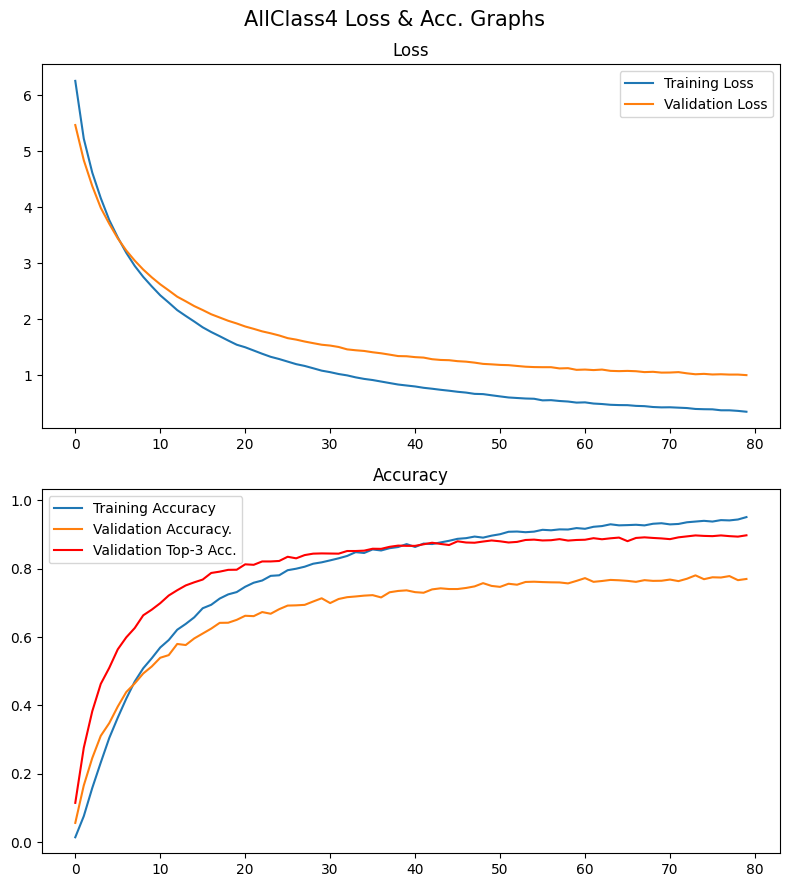

In [16]:
plt.figure(figsize=(8,9))
plt.suptitle("AllClass4 Loss & Acc. Graphs",size=15)

plt.subplot(2,1,1)
plt.plot(range(len(history.history["loss"])),history.history["loss"],label="Training Loss")
plt.plot(range(len(history.history["val_loss"])),history.history["val_loss"],label="Validation Loss")
plt.title("Loss")
plt.legend()

plt.subplot(2,1,2)
plt.plot(range(len(history.history["acc"])),history.history["acc"],label="Training Accuracy")
plt.plot(range(len(history.history["val_acc"])),history.history["val_acc"],label="Validation Accuracy.")
plt.plot(range(len(history.history["val_top3_acc"])),history.history["val_top3_acc"],label="Validation Top-3 Acc.",color="red")
plt.title("Accuracy")
bottom,top=plt.ylim()
plt.ylim(bottom,1-bottom)
plt.legend()

plt.tight_layout()
plt.show()

### Test Set

In [17]:
results = model.evaluate(test_ds, return_dict=True)

print(results)

45/45 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - acc: 0.7740 - loss: 1.0069 - top3_acc: 0.8965
{'acc': 0.7740350961685181, 'loss': 1.0069183111190796, 'top3_acc': 0.8964912295341492}


2/2 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step


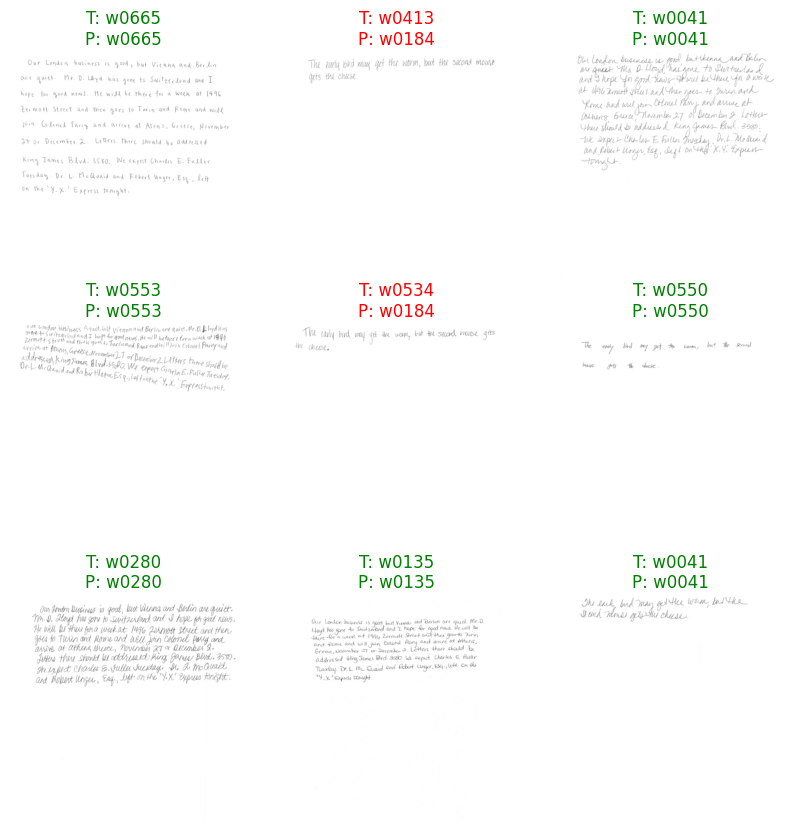

In [18]:
reload_data2.show_testpreds(test_ds,model)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


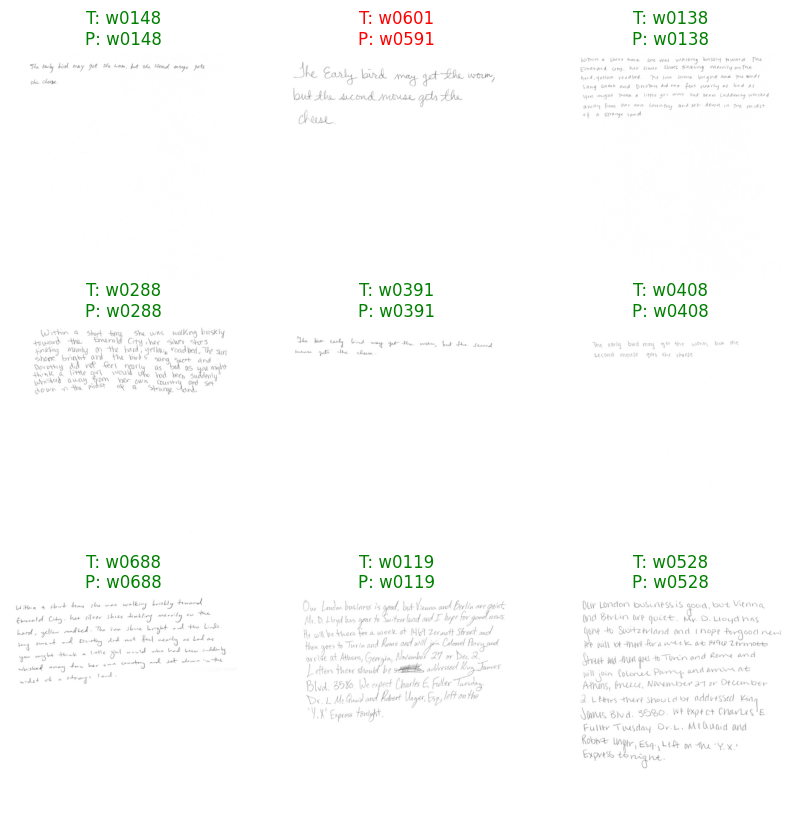

In [19]:
reload_data2.show_testpreds(test_ds,model)

## XAI

In [23]:
import Handwriting_XAI2 as xai

In [39]:
from importlib import reload

In [41]:
reload(xai)

<module 'Handwriting_XAI' from '/content/Handwriting_XAI.py'>

## Grad-CAM

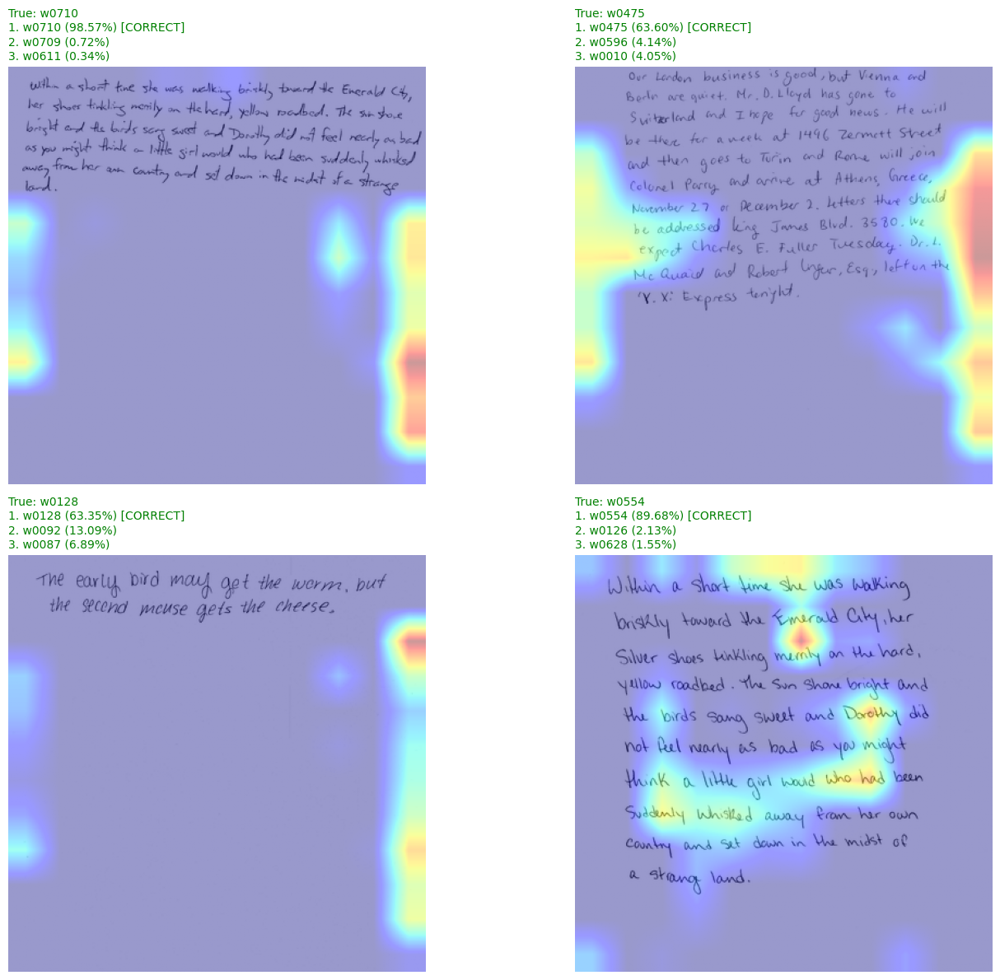

CPU times: user 15.9 s, sys: 857 ms, total: 16.8 s
Wall time: 17 s


In [24]:
%%time
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="out_relu", n=4)

    Focus on whitespace could be a sign of checking length or margin space; valid, but an overreliance??

    Does not seem to correlate with padding

Conv_1_bn



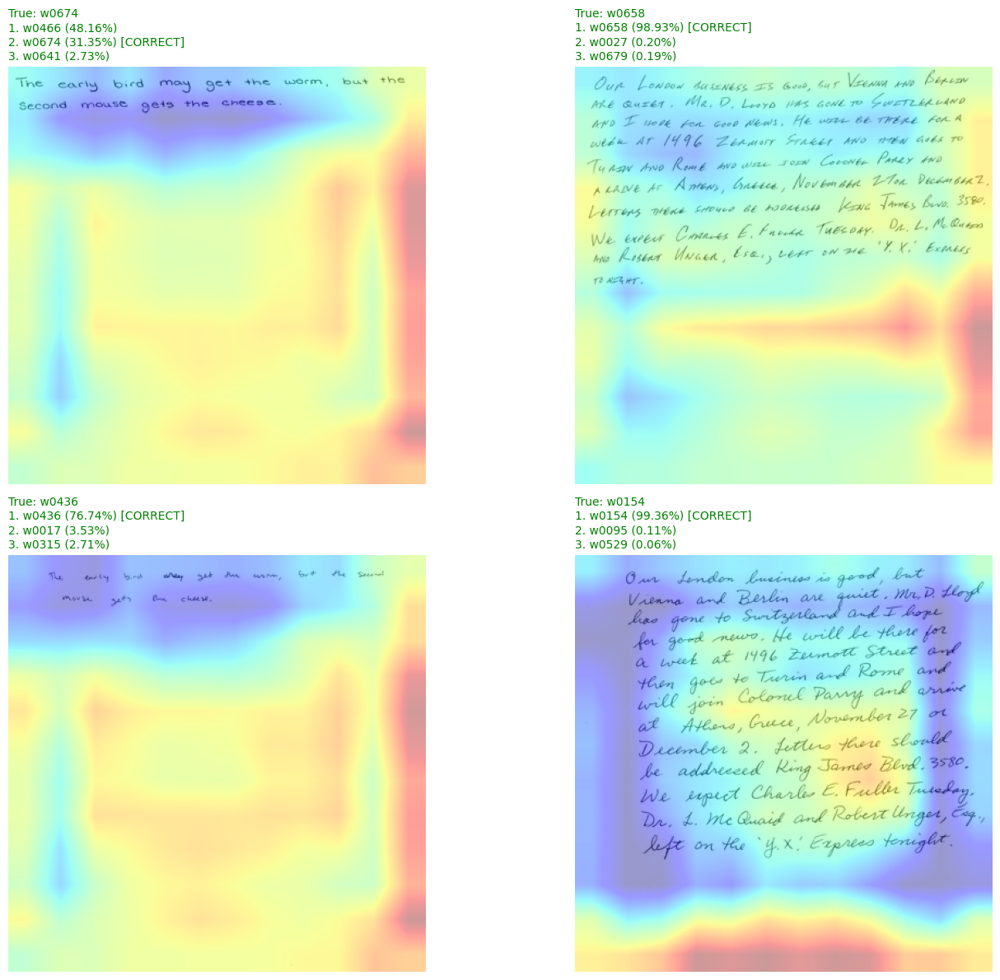

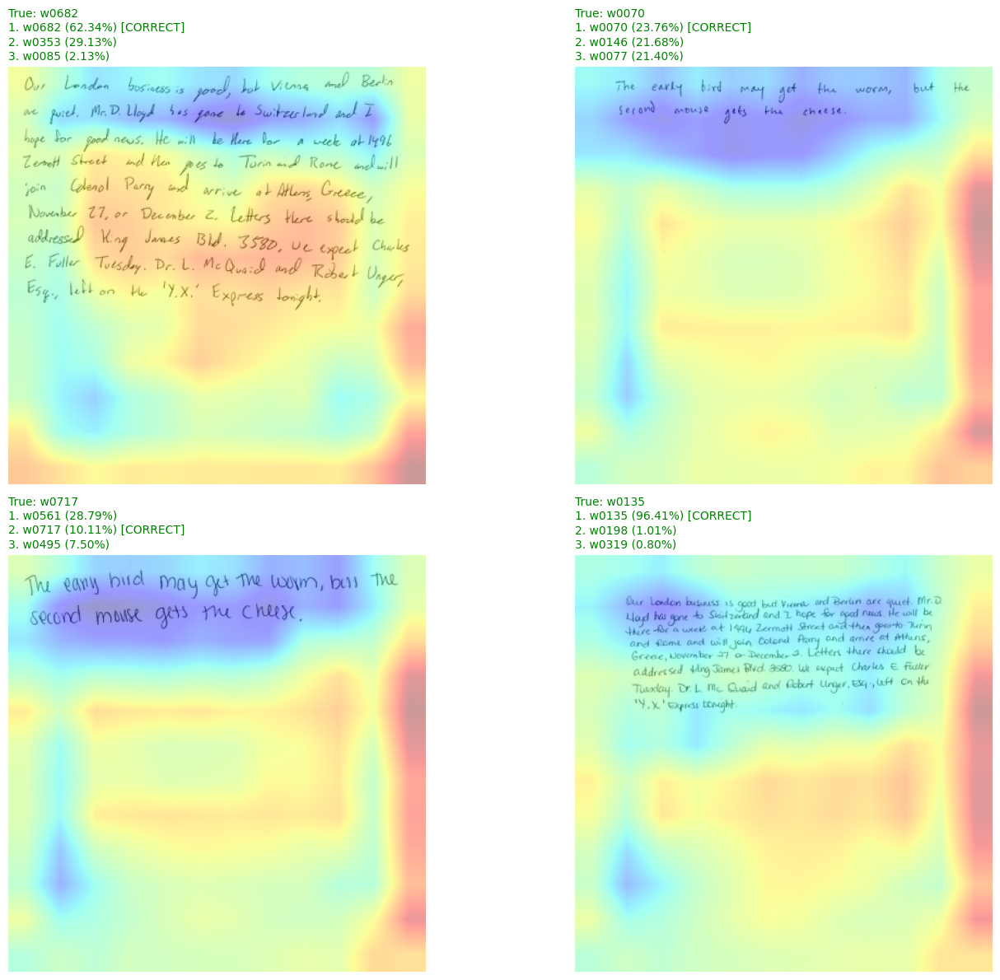

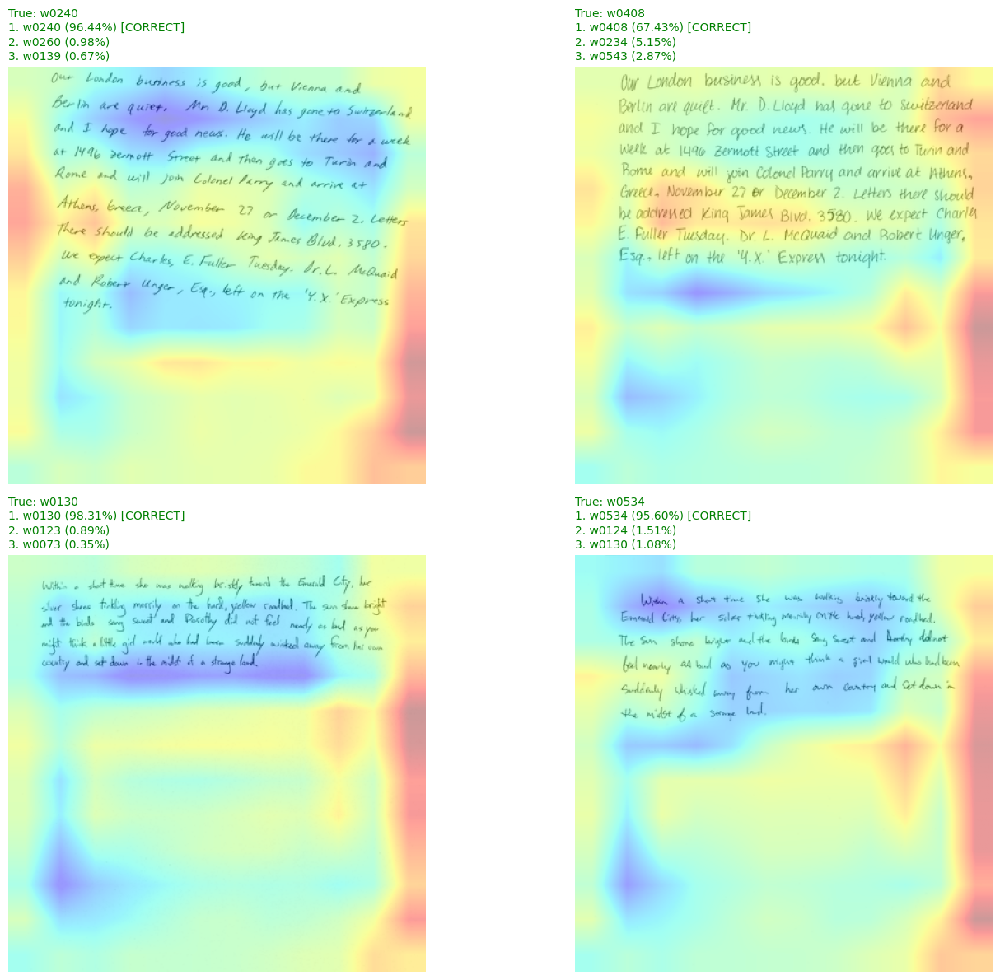

CPU times: user 7.11 s, sys: 254 ms, total: 7.36 s
Wall time: 6.75 s


In [33]:
%%time
print("Conv_1_bn\n")
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="Conv_1_bn", n=4)
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="Conv_1_bn", n=4)
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="Conv_1_bn", n=4)

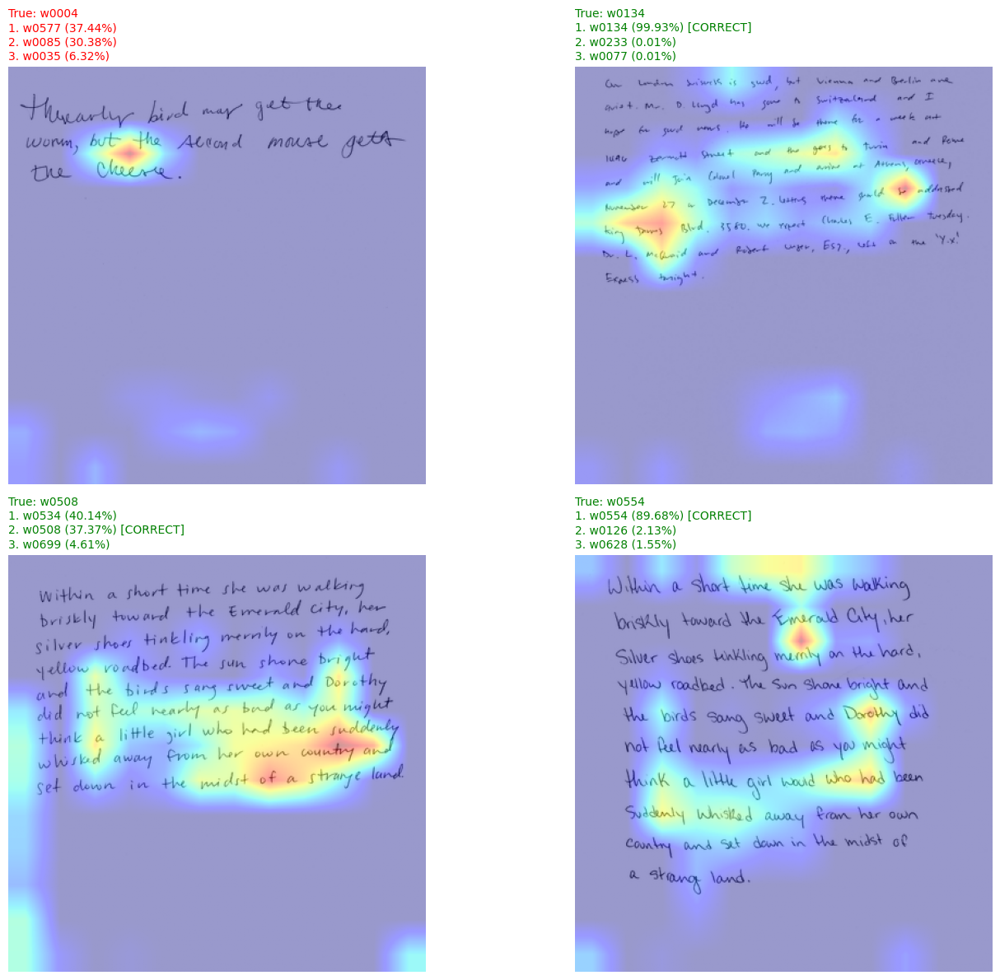

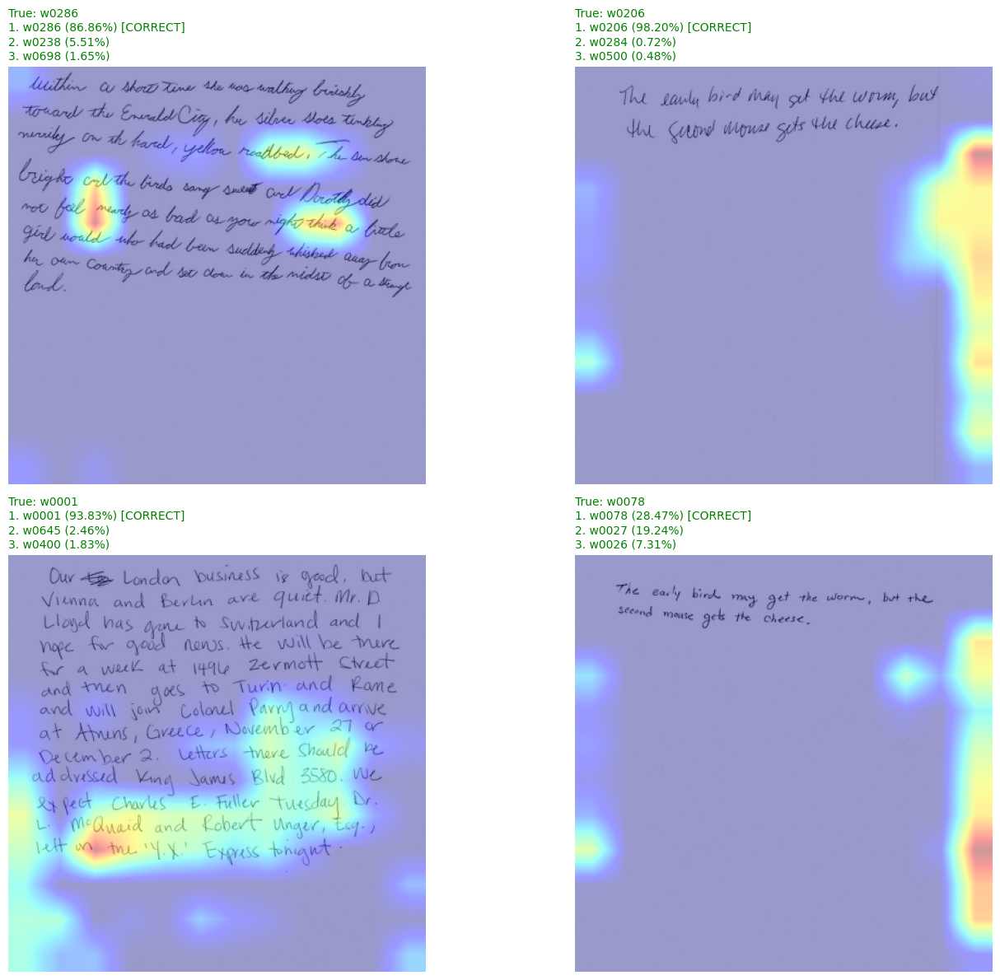

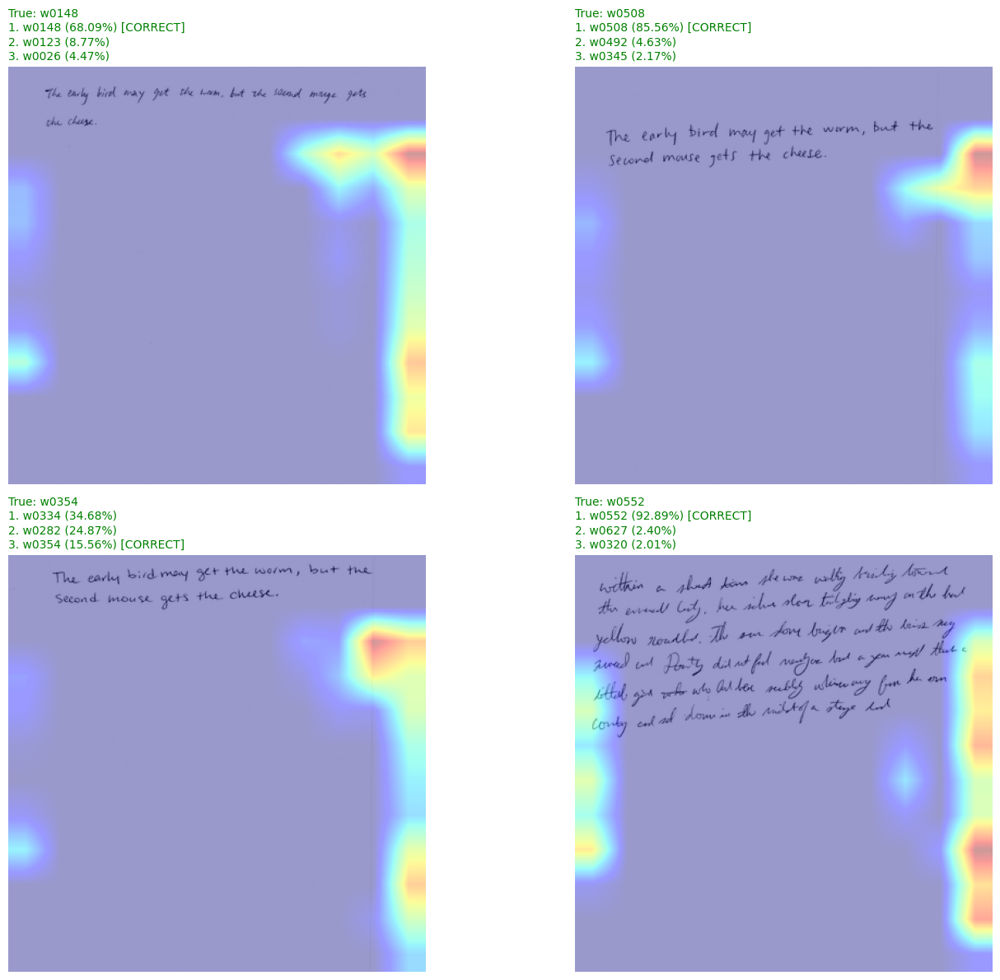

CPU times: user 6.86 s, sys: 264 ms, total: 7.12 s
Wall time: 6.48 s


In [30]:
%%time
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="out_relu", n=4)
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="out_relu", n=4)
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="out_relu", n=4)

    pre-cropped images may be artificially changing the size of writing by acting as a zoom

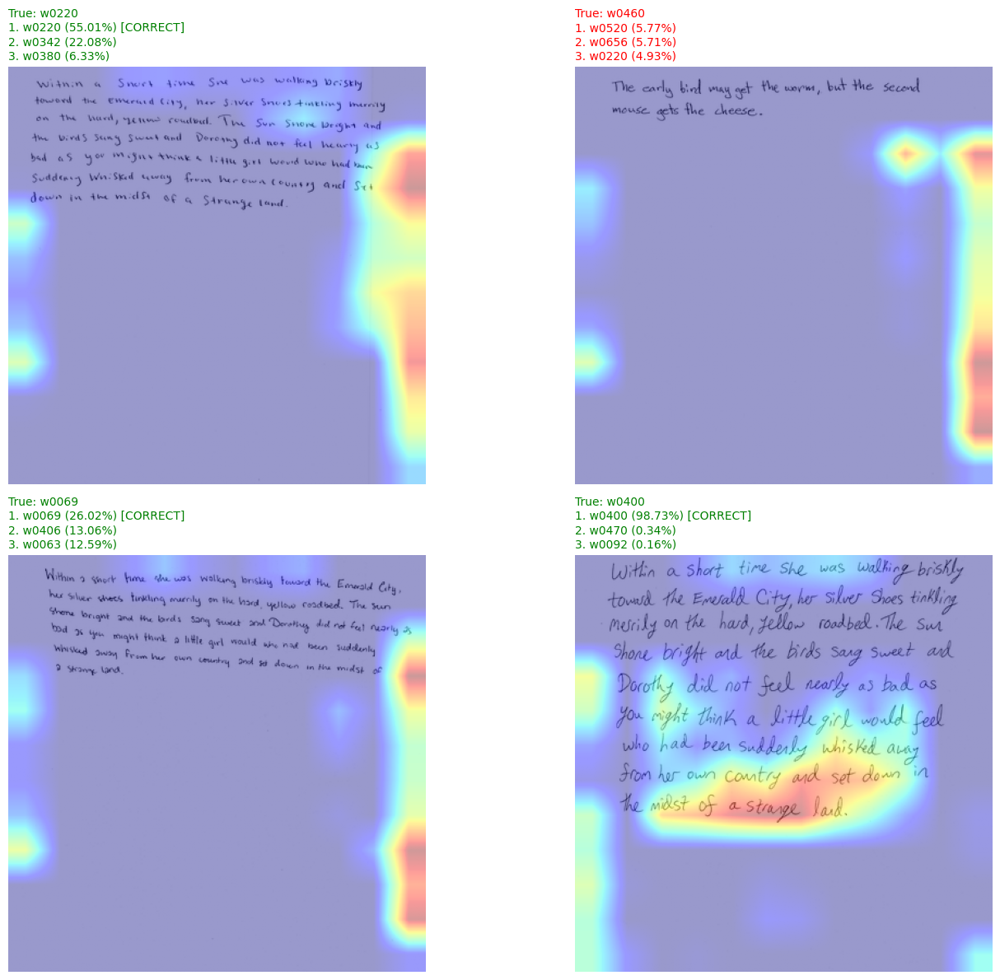

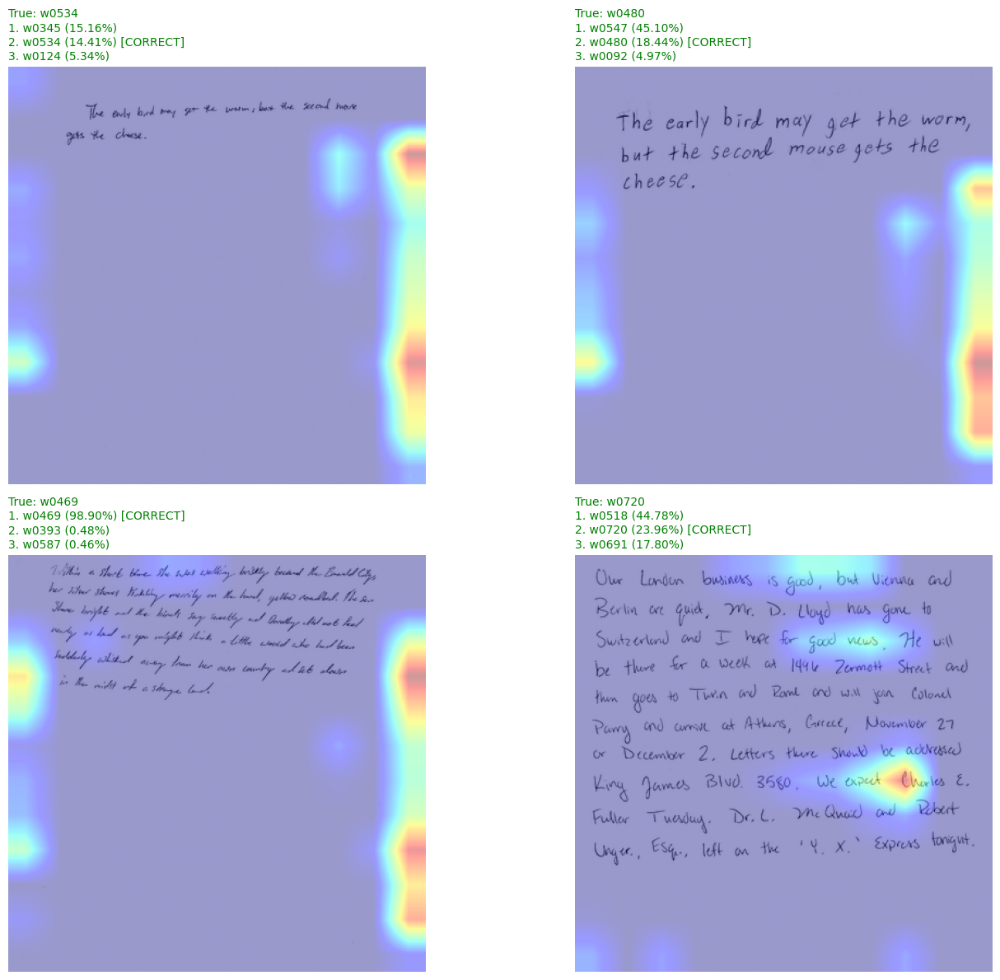

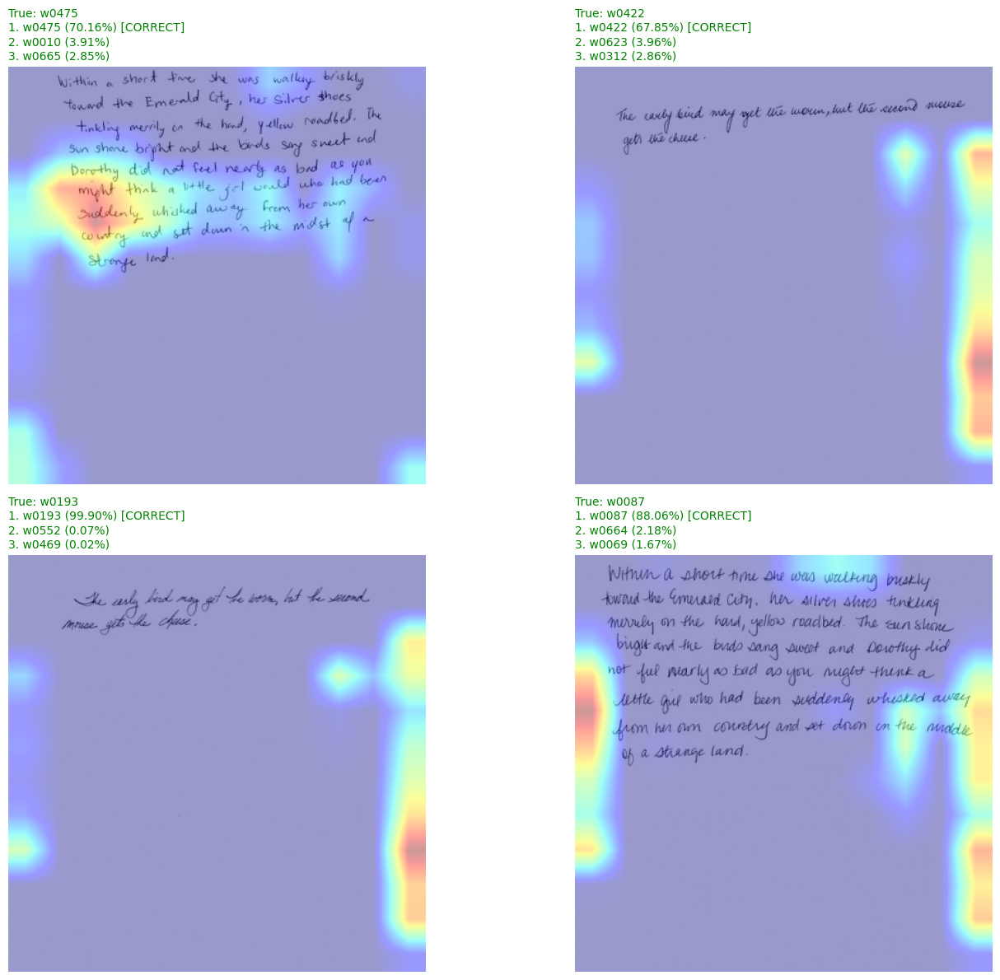

CPU times: user 7.02 s, sys: 243 ms, total: 7.26 s
Wall time: 6.53 s


In [31]:
%%time
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="out_relu", n=4)
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="out_relu", n=4)
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="out_relu", n=4)

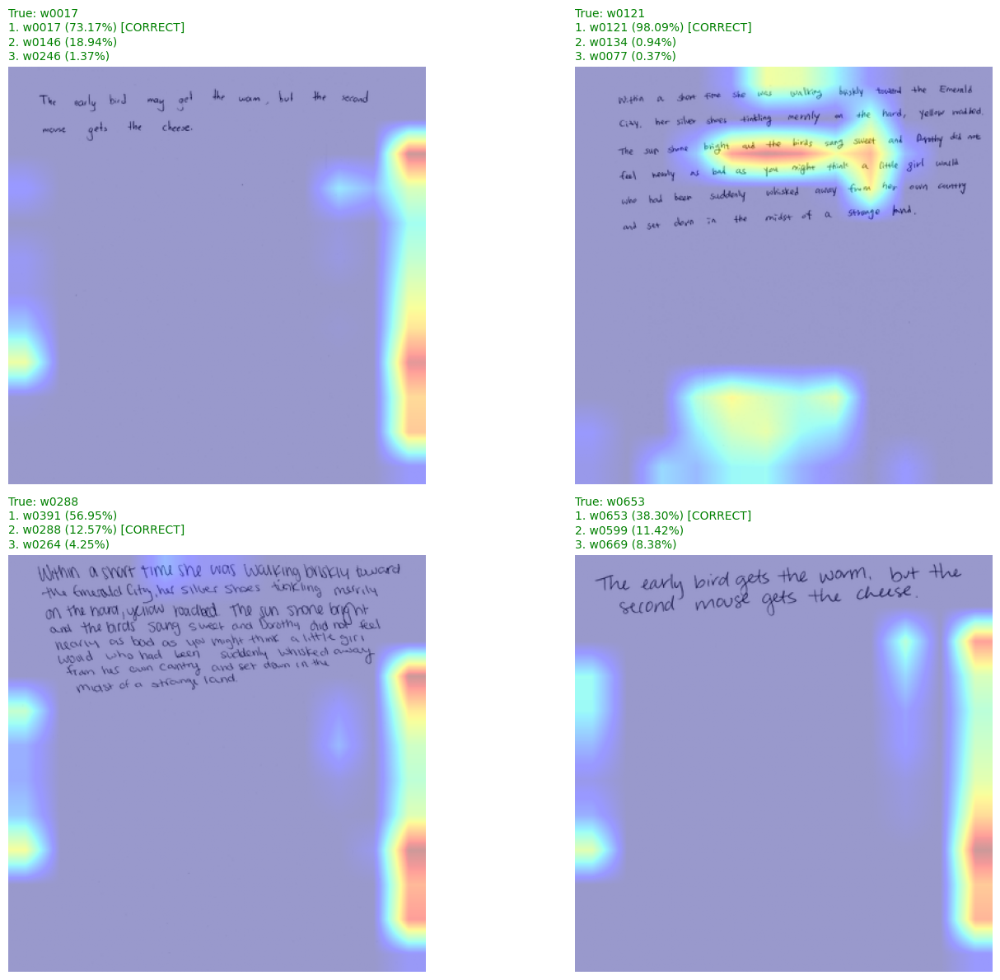

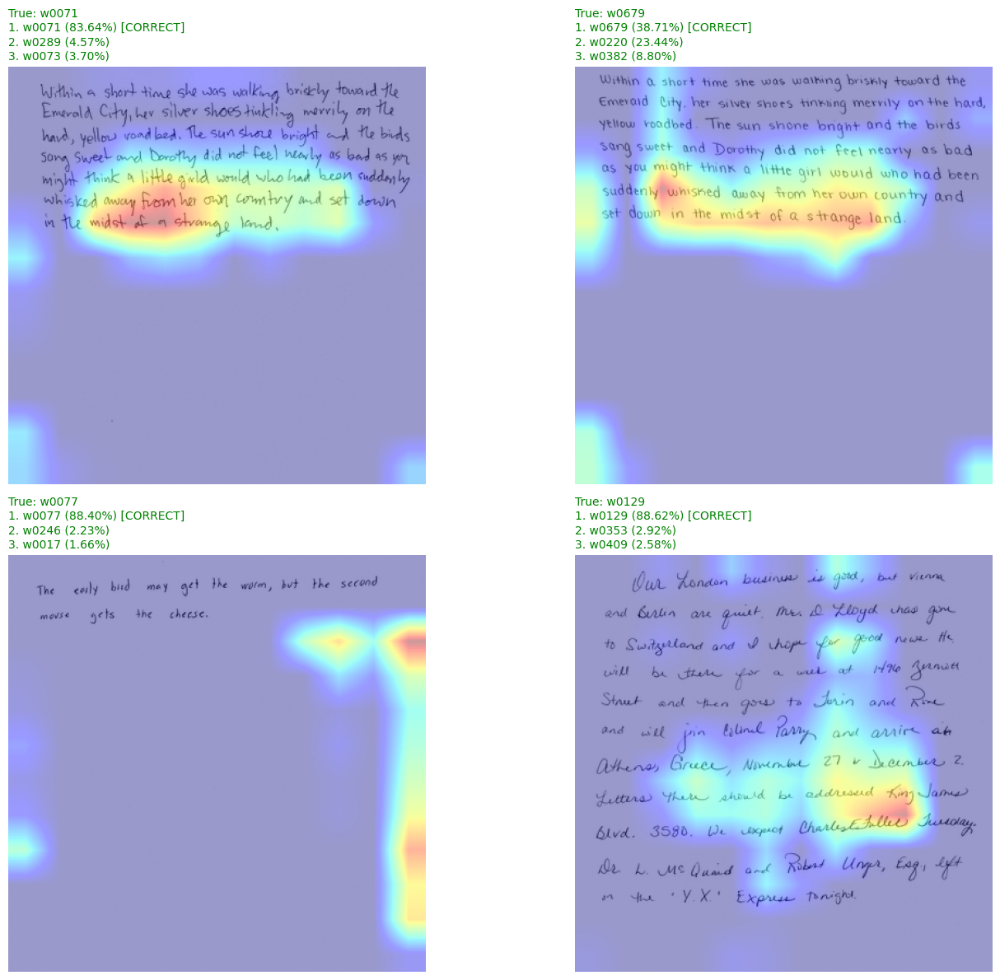

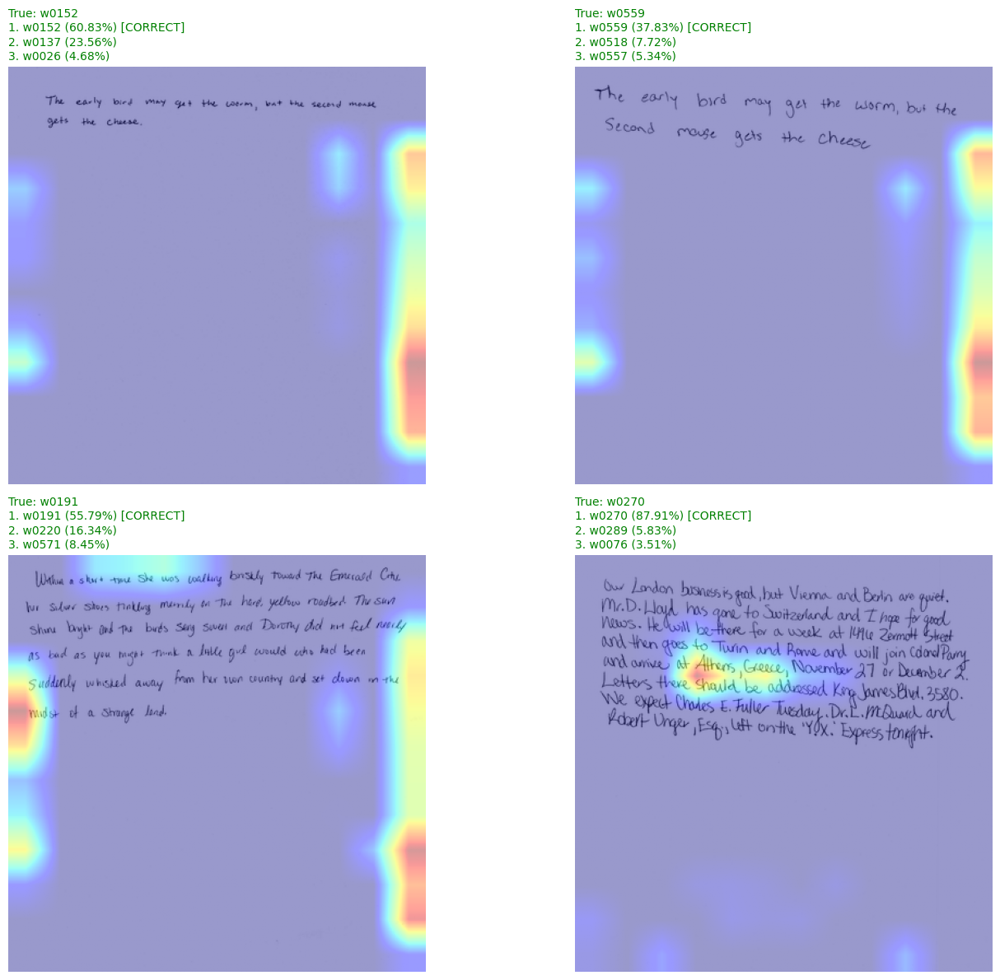

CPU times: user 6.88 s, sys: 222 ms, total: 7.1 s
Wall time: 6.5 s


In [35]:
%%time
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="out_relu", n=4)
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="out_relu", n=4)
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="out_relu", n=4)

## LIME (not working)

In [25]:
help(xai.plot_ultimate_explanation)

Help on function plot_ultimate_explanation in module Handwriting_XAI2:

plot_ultimate_explanation(dataset, model, last_conv_layer_name, num_samples=500, figsize=(14, 12))
    2×2 panel for a single randomly-sampled image:
      [0,0] Original image + true label
      [0,1] LIME: pros (green) and cons (red)
      [1,0] LIME: supportive features only
      [1,1] Grad-CAM overlay



  0%|          | 0/500 [00:00<?, ?it/s]

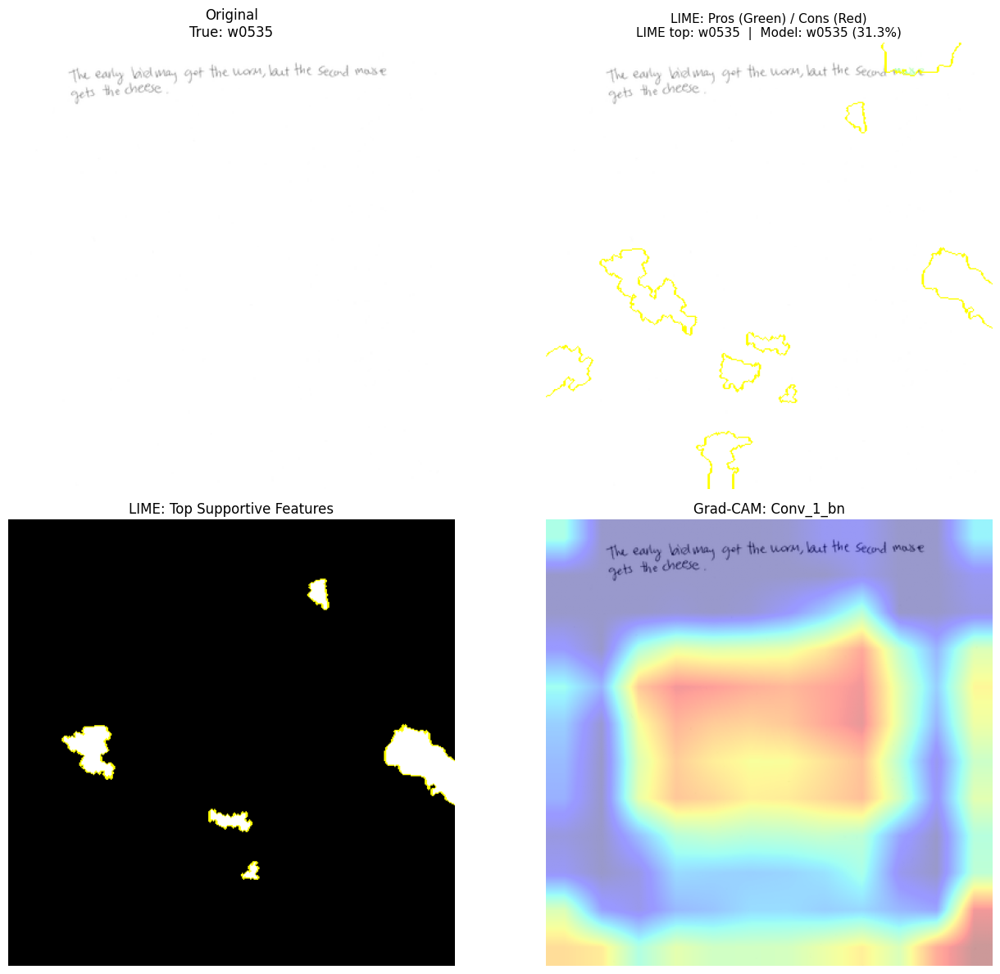

  0%|          | 0/500 [00:00<?, ?it/s]

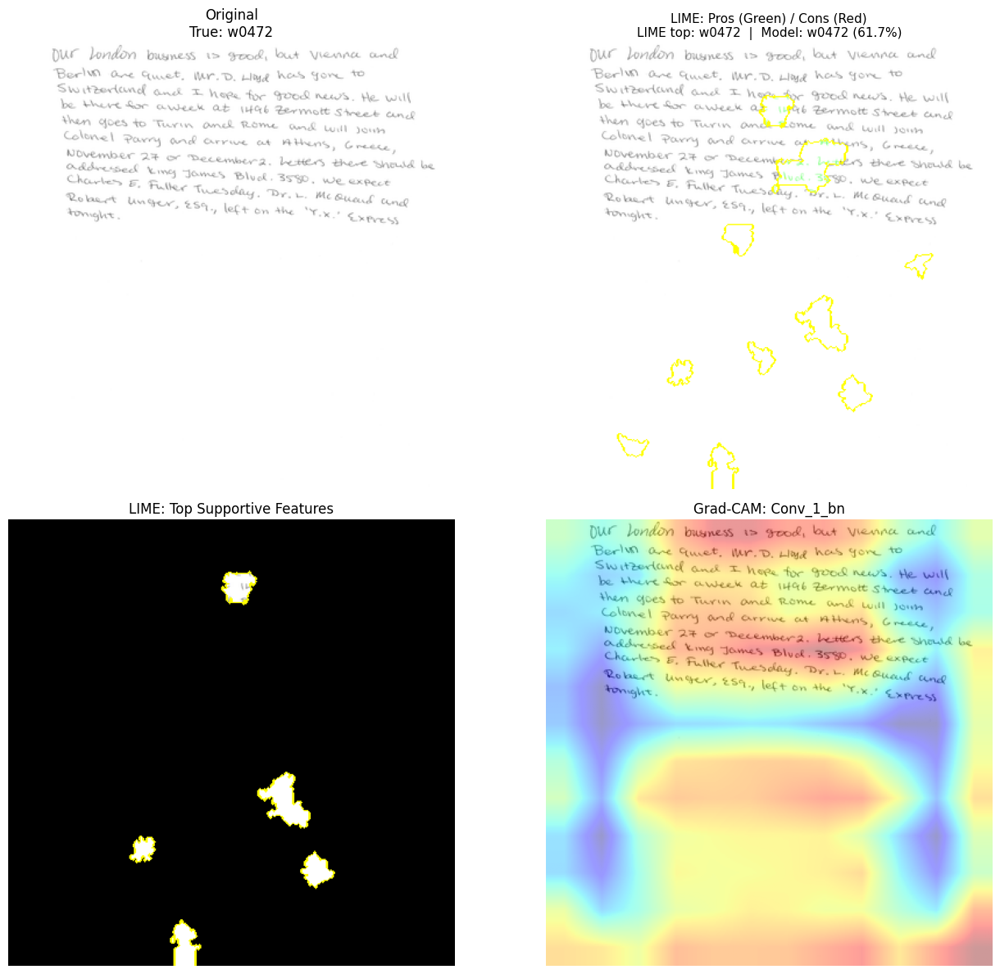

  0%|          | 0/500 [00:00<?, ?it/s]

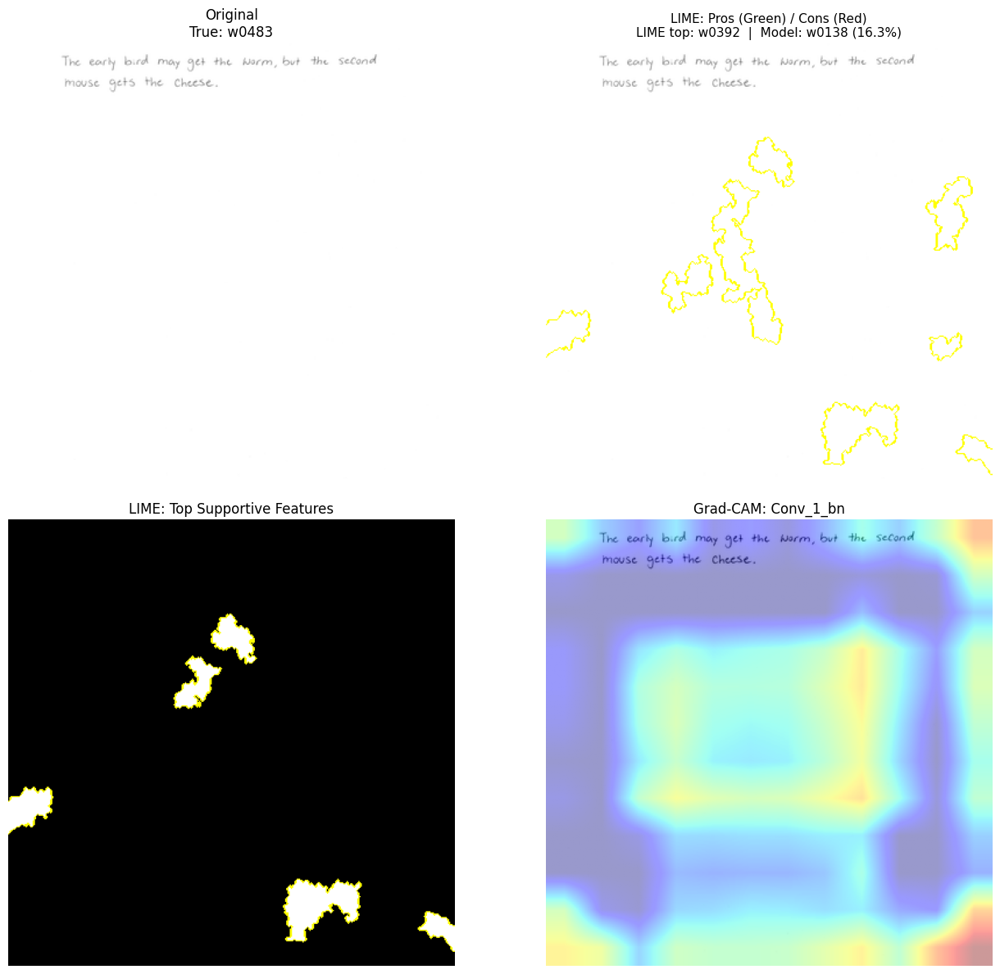

CPU times: user 48.9 s, sys: 5.08 s, total: 54 s
Wall time: 50.5 s


In [27]:
%%time
xai.plot_ultimate_explanation(test_ds,model,"Conv_1_bn")
xai.plot_ultimate_explanation(test_ds,model,"Conv_1_bn")
xai.plot_ultimate_explanation(test_ds,model,"Conv_1_bn")

  0%|          | 0/500 [00:00<?, ?it/s]

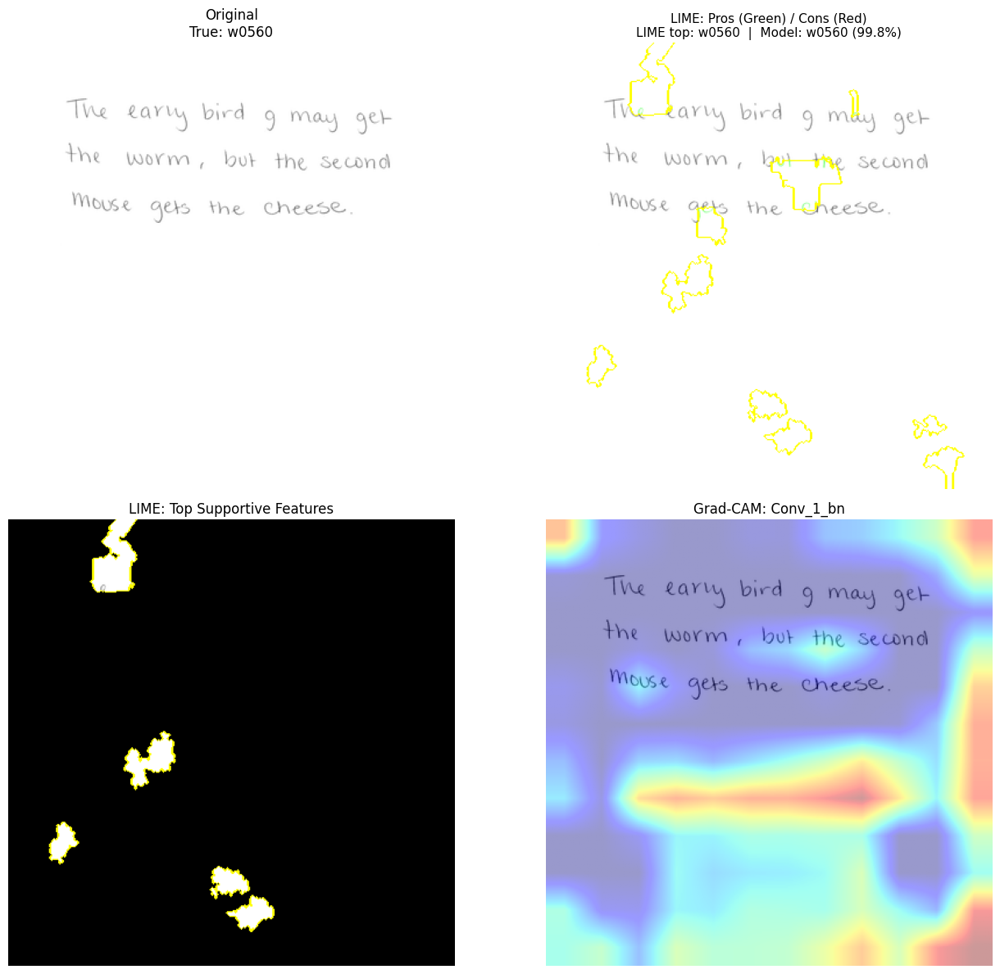

  0%|          | 0/500 [00:00<?, ?it/s]

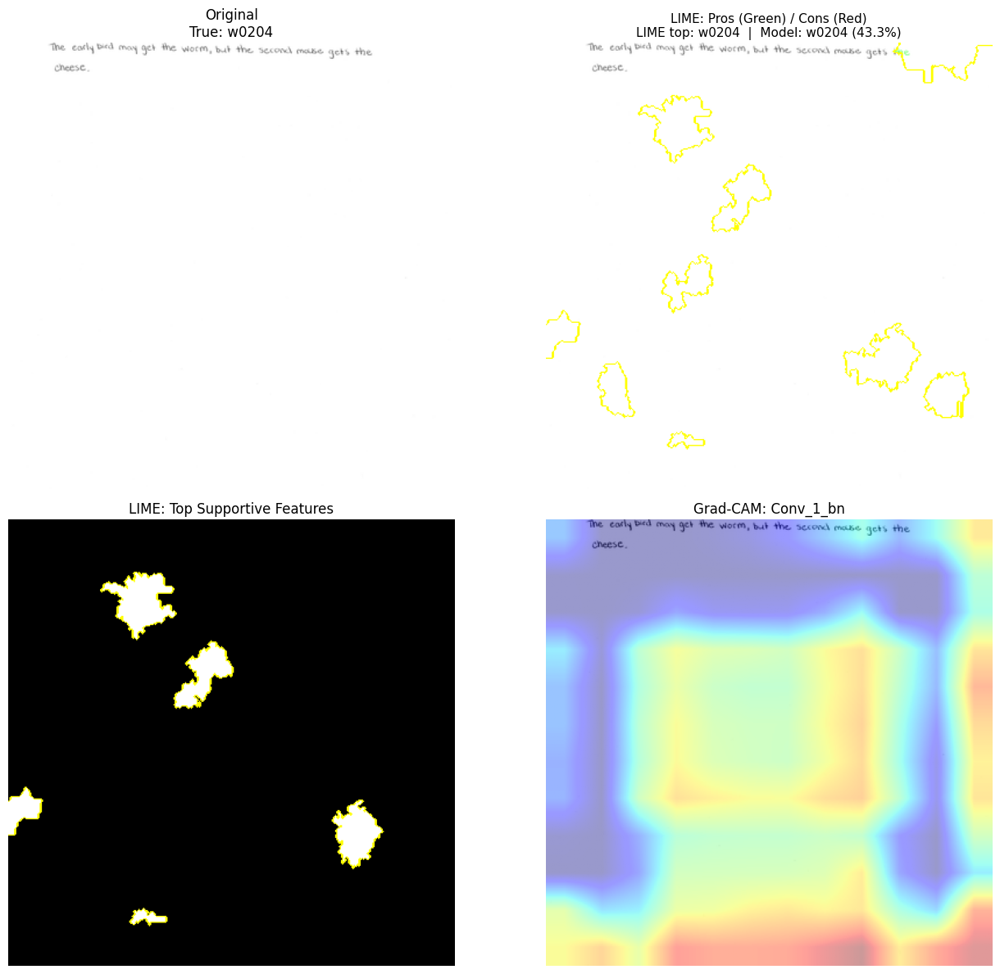

  0%|          | 0/500 [00:00<?, ?it/s]

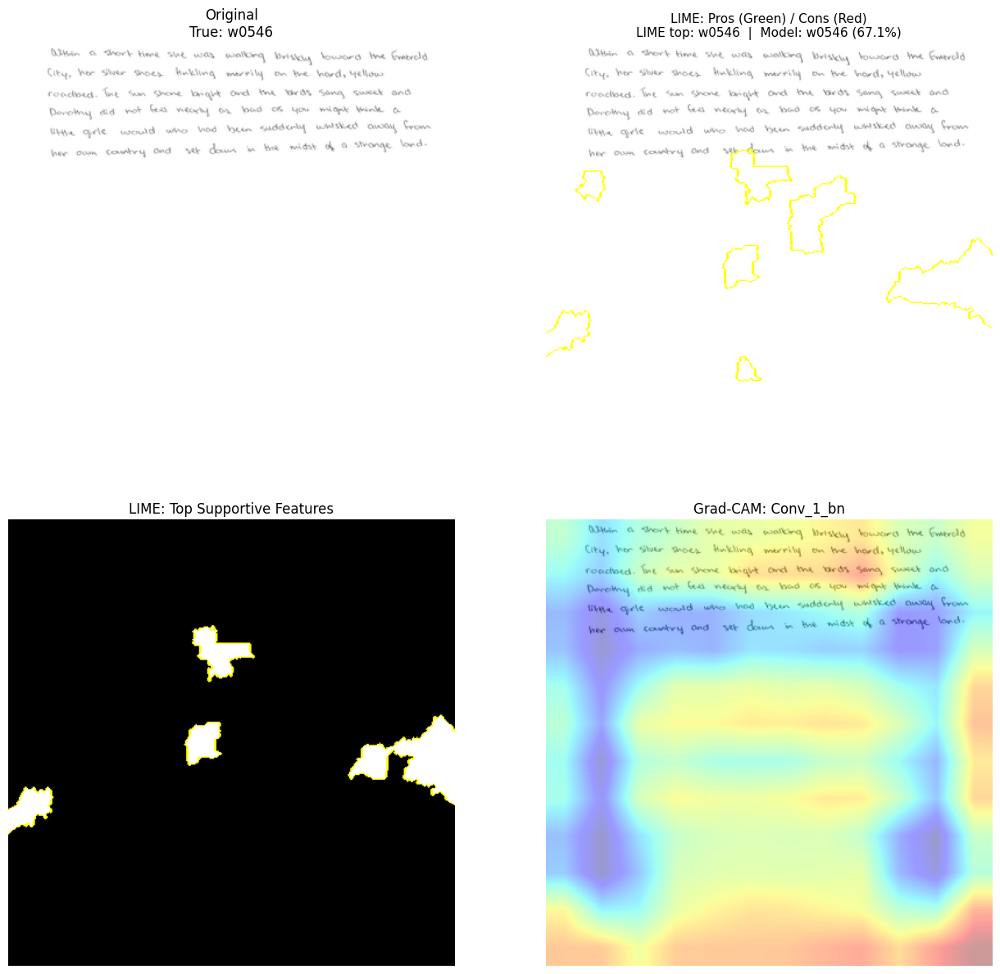

CPU times: user 46.8 s, sys: 5.07 s, total: 51.9 s
Wall time: 50.4 s


In [28]:
%%time
xai.plot_ultimate_explanation(test_ds,model,"Conv_1_bn")
xai.plot_ultimate_explanation(test_ds,model,"Conv_1_bn")
xai.plot_ultimate_explanation(test_ds,model,"Conv_1_bn")